## Import Packages

In [1]:
import numpy as np
import pandas as pd
import networkx as nx
from analyze import NetworkAnalysis
import matplotlib.pyplot as plt

## Import Data and Generate Networks

In [2]:
pre_ban_df = pd.read_csv('data/cleaned_data_before_ban.csv')
post_ban_df = pd.read_csv('data/cleaned_data_after_ban.csv')
id_node = pd.read_csv('id_node.csv').drop_duplicates()

pre_ban_obj = NetworkAnalysis(pre_ban_df)
pre_ban_mono = pre_ban_obj.gen_network(network_type='monopartite')
pre_ban_bi = pre_ban_obj.gen_network(network_type='bipartite')

post_ban_obj = NetworkAnalysis(post_ban_df)
post_ban_mono = post_ban_obj.gen_network(network_type='monopartite')
post_ban_bi = post_ban_obj.gen_network(network_type='bipartite')

In [3]:
pre_ban_mono_subset = pre_ban_obj.gen_subset_network(id_node, pre_ban_mono, network_type='monopartite')
post_ban_mono_subset = post_ban_obj.gen_subset_network(id_node, post_ban_mono, network_type='monopartite')

pre_ban_bi_subset = pre_ban_obj.gen_subset_network(id_node, pre_ban_bi, network_type='bipartite')
post_ban_bi_subset = post_ban_obj.gen_subset_network(id_node, post_ban_bi, network_type='bipartite')

## Test Subset Plot

In [ ]:
def gen_subset_network(self, id_node, network: nx.graph.Graph, network_type):
    df = self.data
    # select top 5k transactions for pre ban
    df = df.sort_values(by=['value'], ascending=False).head(5000)

    id_node_dict = dict(zip(id_node['node'], id_node['id']))
    
    if network_type == 'monopartite':
        # get top 5 nodes based on degree
        mono_deg = pd.DataFrame(network.degree(),columns=['node','degree']).sort_values(by='degree',ascending=False).head(5).reset_index(drop=True)
        mono_top = mono_deg['node']
        mono_top_dict = {key: value for key, value in id_node_dict.items() if key in list(mono_top)}

        # create subset df
        mono_df = df[(df.from_address_type == 'EOA') &
                                    (df.to_address_type == 'EOA')].reset_index(drop=True)
        mono_subset_df = mono_df[mono_df['from_address'].isin(mono_top) | 
                                                mono_df['to_address'].isin(mono_top)].reset_index(drop=True)

        # generate network
        mono_subset = nx.DiGraph()
        mono_subset.add_nodes_from(np.unique(np.array(mono_subset_df['from_address'].append(mono_subset_df['to_address']))))
        mono_subset.add_weighted_edges_from(list(zip(mono_subset_df['from_address'],mono_subset_df['to_address'],mono_subset_df['value'])))

        final_network = mono_subset

    elif network_type == 'bipartite':
        # get top 5 nodes based on degree
        bi_deg = pd.DataFrame(network.degree(),columns=['node','degree']).sort_values(by='degree',ascending=False).head(5).reset_index(drop=True)
        bi_top = bi_deg['node']
        bi_top_dict = {key: value for key, value in id_node_dict.items() if key in list(bi_top)}

        # create subset df
        bi_df = df[((df.from_address_type == 'EOA') & (df.to_address_type == 'Contract')) | ((df.from_address_type == 'Contract') & (df.to_address_type == 'EOA'))].reset_index(drop=True)
        bi_subset_df = bi_df[bi_df['from_address'].isin(bi_top) | 
                                                bi_df['to_address'].isin(bi_top)].reset_index(drop=True)

        # generate network
        bi_subset_users = np.unique(np.array(bi_subset_df['from_address']))
        bi_subset_contracts = np.unique(np.array(bi_subset_df['to_address']))
        bi_subset_edges = list(zip(bi_subset_df['from_address'], bi_subset_df['to_address'], bi_subset_df['value']))

        bi_subset = nx.DiGraph()
        bi_subset.add_nodes_from(bi_subset_users, bipartite=0)
        bi_subset.add_nodes_from(bi_subset_contracts, bipartite=1)
        bi_subset.add_weighted_edges_from(bi_subset_edges)

        final_network = bi_subset

    return final_network                                                     

In [36]:
def plot_subset_network_comparison(id_node,network1,network2,network_type):
    seed = 15; user_color = 'blue'; contract_color = 'red'
    node_size = 500; contract_node_shape = 's'; alpha = 0.25
    arrowsize=30; edge_width=1.5

    id_node_dict = dict(zip(id_node['node'], id_node['id']))

    if network_type == 'monopartite':
        fig = plt.figure(figsize=(50,25), constrained_layout=True)
        ax1 = fig.add_subplot(121)
        ax1.set_axis_off()
        ax1_1 = fig.add_subplot(121)
        ax1_1.set_title('Monopartite Subset Before Ban', fontdict={'fontsize': 75})
        network = network1

        # get top 5 nodes based on degree
        mono_deg = pd.DataFrame(network.degree(),columns=['node','degree']).sort_values(by='degree',ascending=False).head(5).reset_index(drop=True)
        mono_top = mono_deg['node']
        mono_top_dict = {key: value for key, value in id_node_dict.items() if key in list(mono_top)}

        pre_ban_mono_subset_pos=nx.spring_layout(network, seed = seed)
        nx.draw_networkx_nodes(network, pos=pre_ban_mono_subset_pos, nodelist=list(network.nodes()),node_color=user_color, 
                            node_size=node_size, alpha=alpha)
        nx.draw_networkx_edges(network, pos=pre_ban_mono_subset_pos, width=edge_width, alpha=alpha, arrows=True, arrowsize=arrowsize)
        nx.draw_networkx_labels(network, pos=pre_ban_mono_subset_pos, labels=mono_top_dict, 
                                font_color='red', font_size=50, verticalalignment='top',clip_on=False)

        ax2 = fig.add_subplot(122)
        ax2.set_axis_off()
        ax2_1 = fig.add_subplot(122)
        ax2_1.set_title('Monopartite Subset After Ban', fontdict={'fontsize': 75})
        network = network2

        # get top 5 nodes based on degree
        mono_deg = pd.DataFrame(network.degree(),columns=['node','degree']).sort_values(by='degree',ascending=False).head(5).reset_index(drop=True)
        mono_top = mono_deg['node']
        mono_top_dict = {key: value for key, value in id_node_dict.items() if key in list(mono_top)}

        post_ban_mono_subset_pos=nx.spring_layout(network, seed = seed)
        nx.draw_networkx_nodes(network, pos=post_ban_mono_subset_pos, nodelist=list(network.nodes()),node_color=user_color, 
                            node_size=node_size, alpha=alpha)
        nx.draw_networkx_edges(network, pos=post_ban_mono_subset_pos, width=edge_width, alpha=alpha, arrows=True, arrowsize=arrowsize)
        nx.draw_networkx_labels(network, pos=post_ban_mono_subset_pos, labels=mono_top_dict, 
                                font_color='red', font_size=50, verticalalignment='top',clip_on=True)

        plt.show()
    
    elif network_type == 'bipartite':
        fig = plt.figure(figsize=(50,25), constrained_layout=True)
        ax1 = fig.add_subplot(121)
        ax1.set_axis_off()
        ax1_1 = fig.add_subplot(121)
        ax1_1.set_title('Bipartite Subset Before Ban', fontdict={'fontsize': 75})
        network = network1

        bi_deg = pd.DataFrame(network.degree(),columns=['node','degree']).sort_values(by='degree',ascending=False).head(5).reset_index(drop=True)
        bi_top = bi_deg['node']
        bi_top_dict = {key: value for key, value in id_node_dict.items() if key in list(bi_top)}        

        users=[]; contracts=[]
        for node in network.nodes(data=True):
            address = node[0]
            attribute = node[1]['bipartite']
            if attribute == 0:
                users.append(address)
            elif attribute == 1:
                contracts.append(address)

        pre_ban_bi_subset_pos=nx.spring_layout(network, seed = seed)
        nx.draw_networkx_nodes(network, pos=pre_ban_bi_subset_pos, nodelist=list(users),node_color=user_color, 
                                node_size=node_size, alpha=alpha)
        nx.draw_networkx_nodes(network, pos=pre_ban_bi_subset_pos, nodelist=list(contracts),node_color=contract_color,
                                node_size=node_size)
        nx.draw_networkx_edges(network, pos=pre_ban_bi_subset_pos, width=edge_width, alpha=alpha, arrows=True, arrowsize=arrowsize)
        nx.draw_networkx_labels(network, pos=pre_ban_bi_subset_pos, labels=bi_top_dict, 
                                font_color='red', font_size=50, verticalalignment='bottom',clip_on=True)

        ax2 = fig.add_subplot(122)
        ax2.set_axis_off()
        ax2_1 = fig.add_subplot(122)
        ax2_1.set_title('Bipartite Subset After Ban', fontdict={'fontsize': 75})
        network = network2

        bi_deg = pd.DataFrame(pre_ban_bi.degree(),columns=['node','degree']).sort_values(by='degree',ascending=False).head(5).reset_index(drop=True)
        bi_top = bi_deg['node']
        bi_top_dict = {key: value for key, value in id_node_dict.items() if key in list(bi_top)}          

        users=[]; contracts=[]
        for node in network.nodes(data=True):
            address = node[0]
            attribute = node[1]['bipartite']
            if attribute == 0:
                users.append(address)
            elif attribute == 1:
                contracts.append(address)

        post_ban_bi_subset_pos=nx.spring_layout(network, seed = seed)
        nx.draw_networkx_nodes(network, pos=post_ban_bi_subset_pos, nodelist=list(users),node_color=user_color, 
                                node_size=node_size, alpha=alpha)
        nx.draw_networkx_nodes(network, pos=post_ban_bi_subset_pos, nodelist=list(contracts),node_color=contract_color,
                                node_size=node_size)
        nx.draw_networkx_edges(network, pos=post_ban_bi_subset_pos, width=edge_width, alpha=alpha, arrows=True, arrowsize=arrowsize)
        nx.draw_networkx_labels(network, pos=post_ban_bi_subset_pos, labels=bi_top_dict, 
                                font_color='red', font_size=50, verticalalignment='bottom',clip_on=True)

        plt.show()

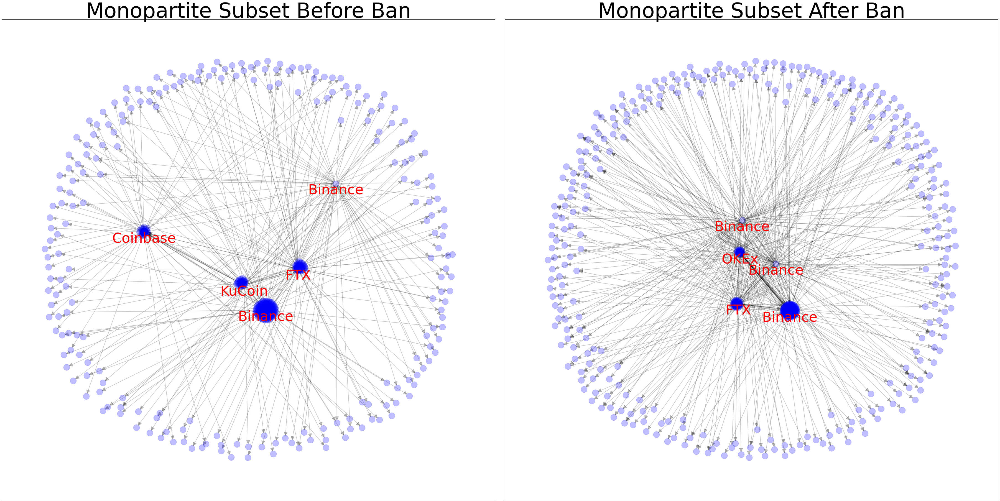

In [4]:
NetworkAnalysis.plot_subset_network_comparison(id_node,pre_ban_mono_subset,post_ban_mono_subset, network_type='monopartite')

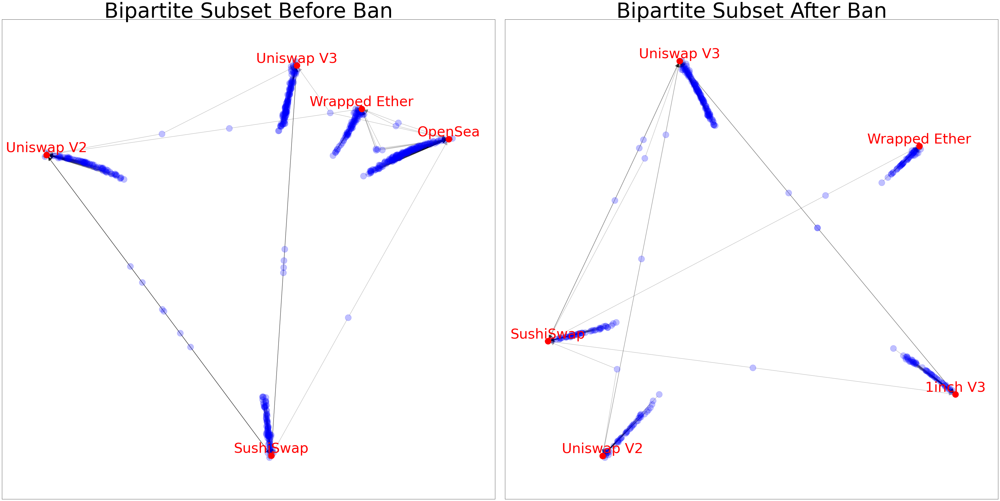

In [5]:
NetworkAnalysis.plot_subset_network_comparison(id_node,pre_ban_bi_subset,post_ban_bi_subset, network_type='bipartite')

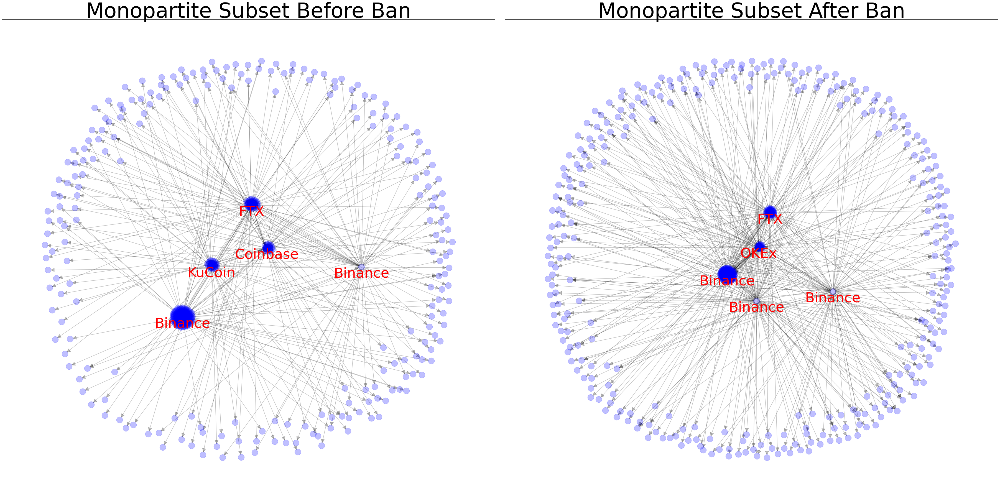

In [34]:
# pre_ban_df = pd.read_csv('data/cleaned_data_before_ban.csv')
# pre_ban_df = pre_ban_df.sort_values(by=['value'], ascending=False).head(5000)

# post_ban_df = pd.read_csv('data/cleaned_data_after_ban.csv')
# post_ban_df = post_ban_df.sort_values(by=['value'], ascending=False).head(5000)

# id_node = pd.read_csv('id_node.csv').drop_duplicates()
# id_node_dict = dict(zip(id_node['node'], id_node['id']))

# # get top 5 nodes based on degree
# pre_ban_mono_deg = pd.DataFrame(pre_ban_mono.degree(),columns=['node','degree']).sort_values(by='degree',ascending=False).head(5).reset_index(drop=True)
# pre_ban_mono_top = pre_ban_mono_deg['node']
# pre_ban_mono_top_dict = {key: value for key, value in id_node_dict.items() if key in list(pre_ban_mono_top)}

# post_ban_mono_deg = pd.DataFrame(post_ban_mono.degree(),columns=['node','degree']).sort_values(by='degree',ascending=False).head(5).reset_index(drop=True)
# post_ban_mono_top = post_ban_mono_deg['node']
# post_ban_mono_top_dict = {key: value for key, value in id_node_dict.items() if key in list(post_ban_mono_top)}

# # create subset df
# pre_ban_mono_df = pre_ban_df[(pre_ban_df.from_address_type == 'EOA') &
#                              (pre_ban_df.to_address_type == 'EOA')].reset_index(drop=True)
# pre_ban_mono_subset_df = pre_ban_mono_df[pre_ban_mono_df['from_address'].isin(pre_ban_mono_top) | 
#                                          pre_ban_mono_df['to_address'].isin(pre_ban_mono_top)].reset_index(drop=True)

# post_ban_mono_df = post_ban_df[(post_ban_df.from_address_type == 'EOA') &
#                              (post_ban_df.to_address_type == 'EOA')].reset_index(drop=True)
# post_ban_mono_subset_df = post_ban_mono_df[post_ban_mono_df['from_address'].isin(post_ban_mono_top) | 
#                                          post_ban_mono_df['to_address'].isin(post_ban_mono_top)].reset_index(drop=True)                                         

# # generate network
# pre_ban_mono_subset = nx.DiGraph()
# pre_ban_mono_subset.add_nodes_from(np.unique(np.array(pre_ban_mono_subset_df['from_address'].append(pre_ban_mono_subset_df['to_address']))))
# pre_ban_mono_subset.add_weighted_edges_from(list(zip(pre_ban_mono_subset_df['from_address'],pre_ban_mono_subset_df['to_address'],pre_ban_mono_subset_df['value'])))

# post_ban_mono_subset = nx.DiGraph()
# post_ban_mono_subset.add_nodes_from(np.unique(np.array(post_ban_mono_subset_df['from_address'].append(post_ban_mono_subset_df['to_address']))))
# post_ban_mono_subset.add_weighted_edges_from(list(zip(post_ban_mono_subset_df['from_address'],post_ban_mono_subset_df['to_address'],post_ban_mono_subset_df['value'])))

# plot
seed = 1; user_color = 'blue'; contract_color = 'red'
node_size = 500; contract_node_shape = 's'; alpha = 0.25
arrowsize=30; edge_width=1.5

fig = plt.figure(figsize=(50,25), constrained_layout=True)
ax1 = fig.add_subplot(121)
ax1.set_axis_off()
ax1_1 = fig.add_subplot(121)
ax1_1.set_title('Monopartite Subset Before Ban', fontdict={'fontsize': 75})
network = pre_ban_mono_subset
pre_ban_mono_subset_pos=nx.spring_layout(network, seed = seed)
nx.draw_networkx_nodes(network, pos=pre_ban_mono_subset_pos, nodelist=list(network.nodes()),node_color=user_color, 
                    node_size=node_size, alpha=alpha)
nx.draw_networkx_edges(network, pos=pre_ban_mono_subset_pos, width=edge_width, alpha=alpha, arrows=True, arrowsize=arrowsize)
nx.draw_networkx_labels(network, pos=pre_ban_mono_subset_pos, labels=pre_ban_mono_top_dict, 
                        font_color='red', font_size=50, verticalalignment='top',clip_on=False)

ax2 = fig.add_subplot(122)
ax2.set_axis_off()
ax2_1 = fig.add_subplot(122)
ax2_1.set_title('Monopartite Subset After Ban', fontdict={'fontsize': 75})
network = post_ban_mono_subset
post_ban_mono_subset_pos=nx.spring_layout(network, seed = seed)
nx.draw_networkx_nodes(network, pos=post_ban_mono_subset_pos, nodelist=list(network.nodes()),node_color=user_color, 
                    node_size=node_size, alpha=alpha)
nx.draw_networkx_edges(network, pos=post_ban_mono_subset_pos, width=edge_width, alpha=alpha, arrows=True, arrowsize=arrowsize)
nx.draw_networkx_labels(network, pos=post_ban_mono_subset_pos, labels=post_ban_mono_top_dict, 
                        font_color='red', font_size=50, verticalalignment='top',clip_on=True)

plt.show()

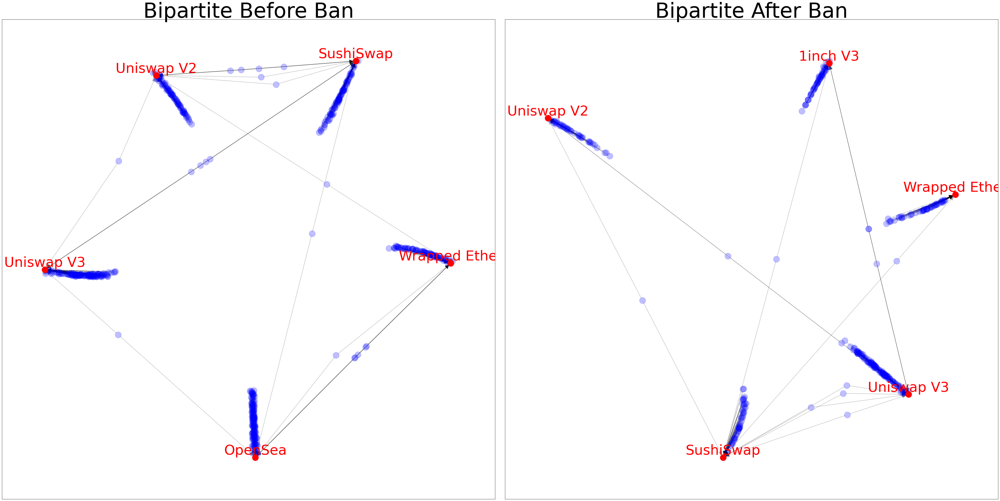

In [35]:
# pre_ban_df = pd.read_csv('data/cleaned_data_before_ban.csv')
# pre_ban_df = pre_ban_df.sort_values(by=['value'], ascending=False).head(5000)

# post_ban_df = pd.read_csv('data/cleaned_data_after_ban.csv')
# post_ban_df = post_ban_df.sort_values(by=['value'], ascending=False).head(5000)

# id_node = pd.read_csv('id_node.csv').drop_duplicates()
# id_node_dict = dict(zip(id_node['node'], id_node['id']))

# # get top 5 nodes based on degree
# ### pre-ban
# pre_ban_bi_deg = pd.DataFrame(pre_ban_bi.degree(),columns=['node','degree']).sort_values(by='degree',ascending=False).head(5).reset_index(drop=True)
# pre_ban_bi_top = pre_ban_bi_deg['node']
# pre_ban_bi_top_dict = {key: value for key, value in id_node_dict.items() if key in list(pre_ban_bi_top)}

# ### post-ban
# post_ban_bi_deg = pd.DataFrame(post_ban_bi.degree(),columns=['node','degree']).sort_values(by='degree',ascending=False).head(5).reset_index(drop=True)
# post_ban_bi_top = post_ban_bi_deg['node']
# post_ban_bi_top_dict = {key: value for key, value in id_node_dict.items() if key in list(post_ban_bi_top)}

# # create subset df
# ### pre-ban
# pre_ban_bi_df = pre_ban_df[((pre_ban_df.from_address_type == 'EOA') & (pre_ban_df.to_address_type == 'Contract')) | ((pre_ban_df.from_address_type == 'Contract') & (pre_ban_df.to_address_type == 'EOA'))].reset_index(drop=True)
# pre_ban_bi_subset_df = pre_ban_bi_df[pre_ban_bi_df['from_address'].isin(pre_ban_bi_top) | 
#                                          pre_ban_bi_df['to_address'].isin(pre_ban_bi_top)].reset_index(drop=True)

# ### post-ban
# post_ban_bi_df = post_ban_df[((post_ban_df.from_address_type == 'EOA') & (post_ban_df.to_address_type == 'Contract')) | ((post_ban_df.from_address_type == 'Contract') & (post_ban_df.to_address_type == 'EOA'))].reset_index(drop=True)
# post_ban_bi_subset_df = post_ban_bi_df[post_ban_bi_df['from_address'].isin(post_ban_bi_top) | post_ban_bi_df['to_address'].isin(post_ban_bi_top)].reset_index(drop=True)

# # generate network
# ### network pre-ban
# pre_ban_bi_subset_users = np.unique(np.array(pre_ban_bi_subset_df['from_address']))
# pre_ban_bi_subset_contracts = np.unique(np.array(pre_ban_bi_subset_df['to_address']))
# pre_ban_bi_subset_edges = list(zip(pre_ban_bi_subset_df['from_address'], pre_ban_bi_subset_df['to_address'], pre_ban_bi_subset_df['value']))

# pre_ban_bi_subset = nx.DiGraph()
# pre_ban_bi_subset.add_nodes_from(pre_ban_bi_subset_users, bipartite=0)
# pre_ban_bi_subset.add_nodes_from(pre_ban_bi_subset_contracts, bipartite=1)
# pre_ban_bi_subset.add_weighted_edges_from(pre_ban_bi_subset_edges)

# ### network post-ban
# post_ban_bi_subset_users = np.unique(np.array(post_ban_bi_subset_df['from_address']))
# post_ban_bi_subset_contracts = np.unique(np.array(post_ban_bi_subset_df['to_address']))
# post_ban_bi_subset_edges = list(zip(post_ban_bi_subset_df['from_address'], post_ban_bi_subset_df['to_address'], post_ban_bi_subset_df['value']))

# post_ban_bi_subset = nx.DiGraph()
# post_ban_bi_subset.add_nodes_from(post_ban_bi_subset_users, bipartite=0)
# post_ban_bi_subset.add_nodes_from(post_ban_bi_subset_contracts, bipartite=1)
# post_ban_bi_subset.add_weighted_edges_from(post_ban_bi_subset_edges)

# plot
seed = 1; user_color = 'blue'; contract_color = 'red'
node_size = 500; contract_node_shape = 's'; alpha = 0.25
arrowsize=30; edge_width=1.5

fig = plt.figure(figsize=(50,25), constrained_layout=True)
ax1 = fig.add_subplot(121)
ax1.set_axis_off()
ax1_1 = fig.add_subplot(121)
ax1_1.set_title('Bipartite Before Ban', fontdict={'fontsize': 75})
network = pre_ban_bi_subset

users=[]; contracts=[]
for node in network.nodes(data=True):
    address = node[0]
    attribute = node[1]['bipartite']
    if attribute == 0:
        users.append(address)
    elif attribute == 1:
        contracts.append(address)

pre_ban_bi_subset_pos=nx.spring_layout(network, seed = seed)
nx.draw_networkx_nodes(network, pos=pre_ban_bi_subset_pos, nodelist=list(users),node_color=user_color, 
                        node_size=node_size, alpha=alpha)
nx.draw_networkx_nodes(network, pos=pre_ban_bi_subset_pos, nodelist=list(contracts),node_color=contract_color,
                        node_size=node_size)
nx.draw_networkx_edges(network, pos=pre_ban_bi_subset_pos, width=edge_width, alpha=alpha, arrows=True, arrowsize=arrowsize)
nx.draw_networkx_labels(network, pos=pre_ban_bi_subset_pos, labels=pre_ban_bi_top_dict, 
                        font_color='red', font_size=50, verticalalignment='bottom',clip_on=True)

ax2 = fig.add_subplot(122)
ax2.set_axis_off()
ax2_1 = fig.add_subplot(122)
ax2_1.set_title('Bipartite After Ban', fontdict={'fontsize': 75})
network = post_ban_bi_subset

users=[]; contracts=[]
for node in network.nodes(data=True):
    address = node[0]
    attribute = node[1]['bipartite']
    if attribute == 0:
        users.append(address)
    elif attribute == 1:
        contracts.append(address)

post_ban_bi_subset_pos=nx.spring_layout(network, seed = seed)
nx.draw_networkx_nodes(network, pos=post_ban_bi_subset_pos, nodelist=list(users),node_color=user_color, 
                        node_size=node_size, alpha=alpha)
nx.draw_networkx_nodes(network, pos=post_ban_bi_subset_pos, nodelist=list(contracts),node_color=contract_color,
                        node_size=node_size)
nx.draw_networkx_edges(network, pos=post_ban_bi_subset_pos, width=edge_width, alpha=alpha, arrows=True, arrowsize=arrowsize)
nx.draw_networkx_labels(network, pos=post_ban_bi_subset_pos, labels=post_ban_bi_top_dict, 
                        font_color='red', font_size=50, verticalalignment='bottom',clip_on=True)

plt.show()

## Plot Networks

Network before ban is bipartite: True
Network after ban is bipartite: True


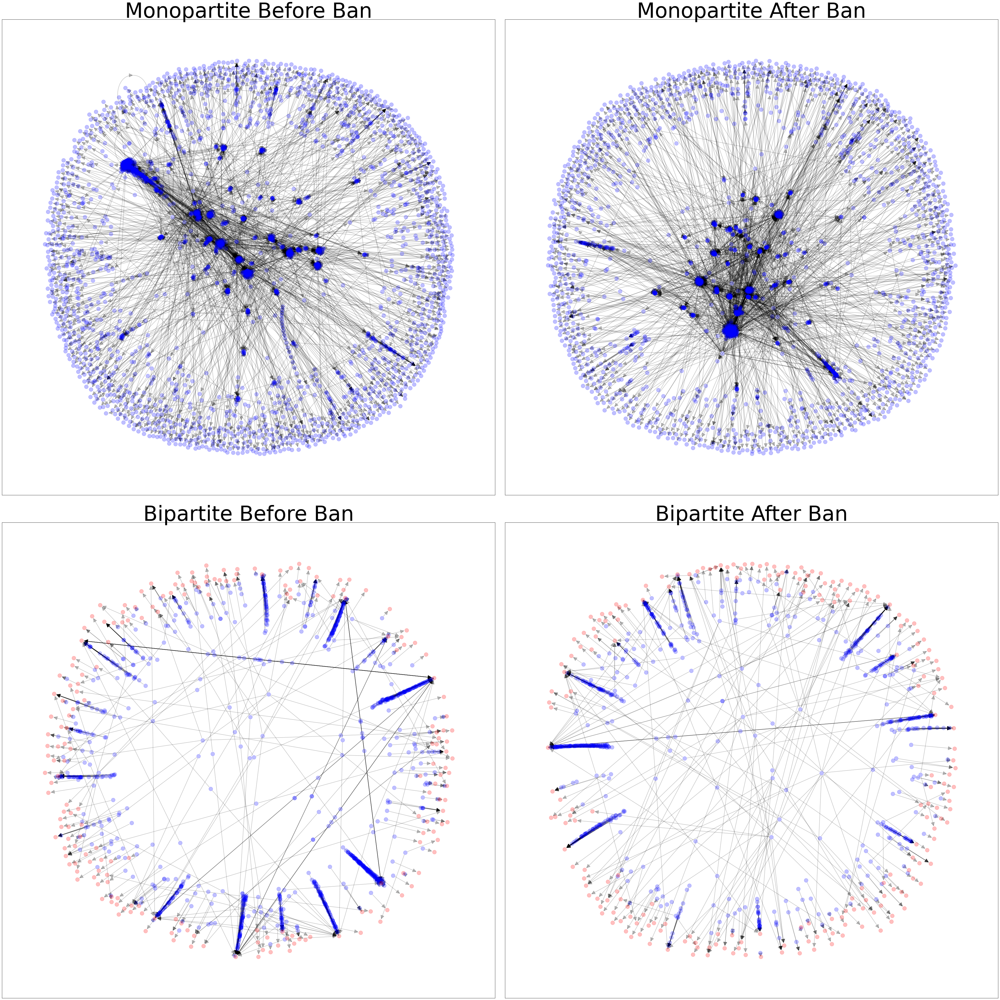

In [58]:
NetworkAnalysis.plot_network_comparison([pre_ban_obj, post_ban_obj],
                                        [pre_ban_mono,post_ban_mono,pre_ban_bi,post_ban_bi])

## Degree Summary Statistics

In [12]:
pre_ban_mono_k = NetworkAnalysis.cal_degree(pre_ban_mono)
post_ban_mono_k = NetworkAnalysis.cal_degree(post_ban_mono)
pre_ban_bi_k = NetworkAnalysis.cal_degree(pre_ban_bi)
post_ban_bi_k = NetworkAnalysis.cal_degree(post_ban_bi)

NetworkAnalysis.degree_stats(pre_ban_mono_k, post_ban_mono_k, pre_ban_bi_k, post_ban_bi_k)

Overall Degree Summary Statistics:
+-------+---------------------+----------------------+-------------------+--------------------+
| Stats | Monopartite Pre-Ban | Monopartite Post-Ban | Bipartite Pre-Ban | Bipartite Post-Ban |
+-------+---------------------+----------------------+-------------------+--------------------+
|  Mean |         2.02        |         2.34         |        1.83       |        1.81        |
|  Min  |          1          |          1           |         1         |         1          |
|  Max  |         269         |         306          |        152        |        123         |
|  Std  |         6.72        |         8.61         |        7.53       |        5.78        |
+-------+---------------------+----------------------+-------------------+--------------------+


## Degree Distribution

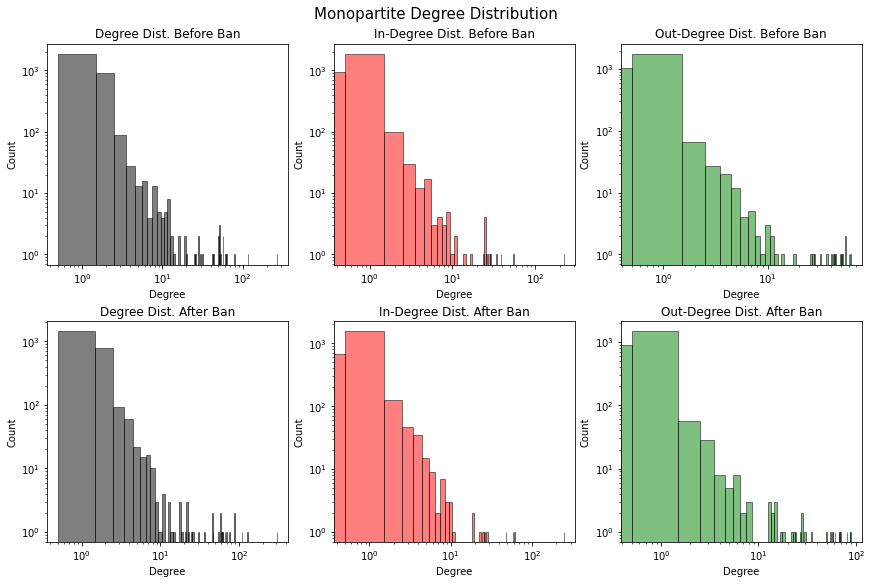

In [5]:
NetworkAnalysis.plot_degree_dist(pre_ban_mono,post_ban_mono,"Monopartite Degree Distribution")

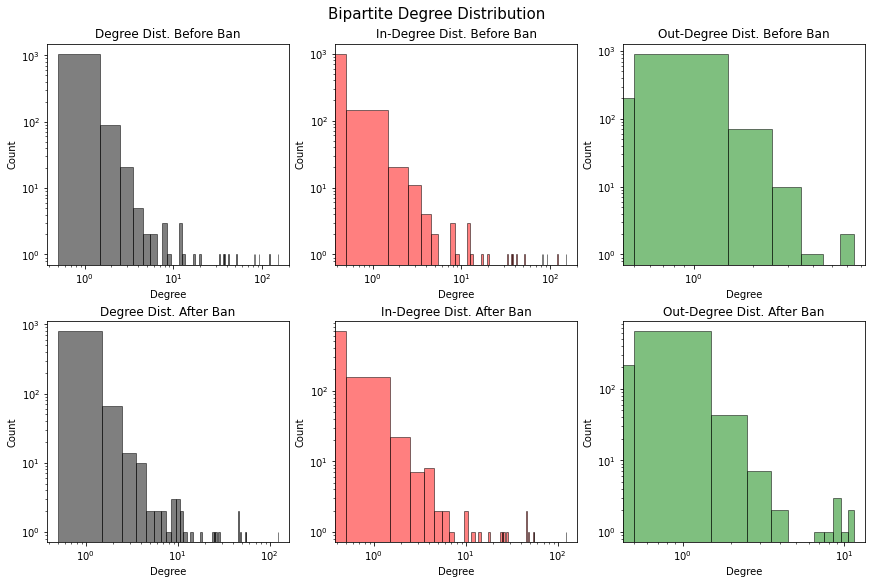

In [6]:
NetworkAnalysis.plot_degree_dist(pre_ban_bi,post_ban_bi,"Bipartite Degree Distribution")

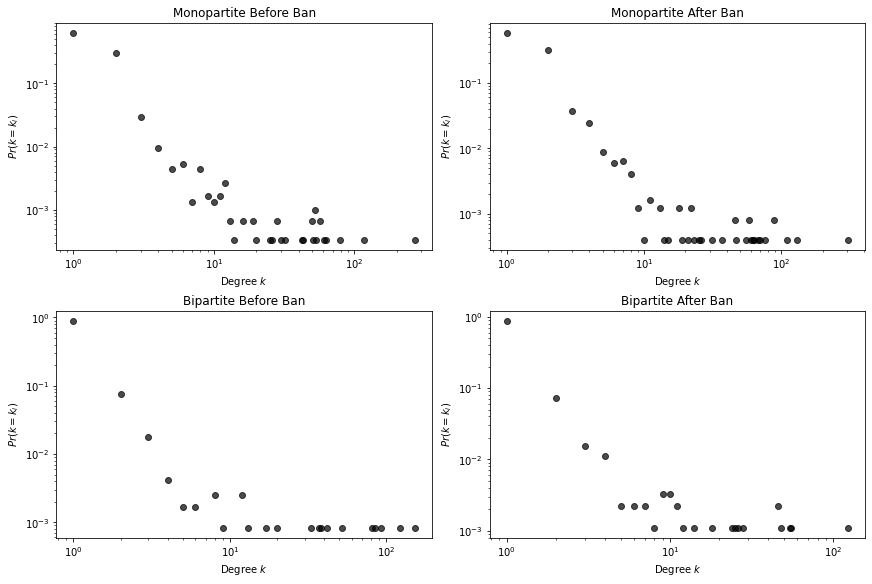

In [7]:
NetworkAnalysis.plot_power_law(pre_ban_mono,post_ban_mono,pre_ban_bi,post_ban_bi)

## Centrality Summary Statistics

In [14]:
bc_1 = NetworkAnalysis.cal_betweenness_cen(pre_ban_mono); bc_2 = NetworkAnalysis.cal_betweenness_cen(post_ban_mono)
ec_1 = NetworkAnalysis.cal_eig_cen(pre_ban_mono); ec_2 = NetworkAnalysis.cal_eig_cen(post_ban_mono)
dc_1 = NetworkAnalysis.cal_deg_cen(pre_ban_mono); dc_2 = NetworkAnalysis.cal_deg_cen(post_ban_mono)
cc_1 = NetworkAnalysis.cal_close_cen(pre_ban_mono); cc_2 = NetworkAnalysis.cal_close_cen(post_ban_mono)

NetworkAnalysis.centrality_stats(bc_1,bc_2,ec_1,ec_2,dc_1,dc_2,cc_1,cc_2,
                                 'Monopartite Network Centrality Measures')

Monopartite Network Centrality Measures:
+-------+-----------------------+------------------------+------------------------+-------------------------+
| Stats | Betweeness C. Pre-Ban | Betweeness C. Post-Ban | Eigenvector C. Pre-Ban | Eigenvector C. Post-Ban |
+-------+-----------------------+------------------------+------------------------+-------------------------+
|  Mean |        0.00019        |        0.00024         |        0.00686         |         0.00787         |
|  Min  |          0.0          |          0.0           |          0.0           |           0.0           |
|  Max  |        0.08476        |        0.09732         |        0.21398         |         0.24698         |
|  Std  |        0.00183        |        0.00235         |        0.01699         |         0.01842         |
+-------+-----------------------+------------------------+------------------------+-------------------------+
+-------+-------------------+--------------------+----------------------+------

In [15]:
bc_1 = NetworkAnalysis.cal_betweenness_cen(pre_ban_bi); bc_2 = NetworkAnalysis.cal_betweenness_cen(post_ban_bi)
ec_1 = NetworkAnalysis.cal_eig_cen(pre_ban_bi); ec_2 = NetworkAnalysis.cal_eig_cen(post_ban_bi)
dc_1 = NetworkAnalysis.cal_deg_cen(pre_ban_bi); dc_2 = NetworkAnalysis.cal_deg_cen(post_ban_bi)
cc_1 = NetworkAnalysis.cal_close_cen(pre_ban_bi); cc_2 = NetworkAnalysis.cal_close_cen(post_ban_bi)

NetworkAnalysis.centrality_stats(bc_1,bc_2,ec_1,ec_2,dc_1,dc_2,cc_1,cc_2,
                                 'Bipartite Network Centrality Measures')

Bipartite Network Centrality Measures:
+-------+-----------------------+------------------------+------------------------+-------------------------+
| Stats | Betweeness C. Pre-Ban | Betweeness C. Post-Ban | Eigenvector C. Pre-Ban | Eigenvector C. Post-Ban |
+-------+-----------------------+------------------------+------------------------+-------------------------+
|  Mean |          0.0          |          0.0           |        0.00351         |         0.00516         |
|  Min  |          0.0          |          0.0           |         6e-05          |          7e-05          |
|  Max  |          0.0          |          0.0           |        0.57262         |         0.69025         |
|  Std  |          0.0          |          0.0           |        0.02869         |         0.03276         |
+-------+-----------------------+------------------------+------------------------+-------------------------+
+-------+-------------------+--------------------+----------------------+--------

## Modularity

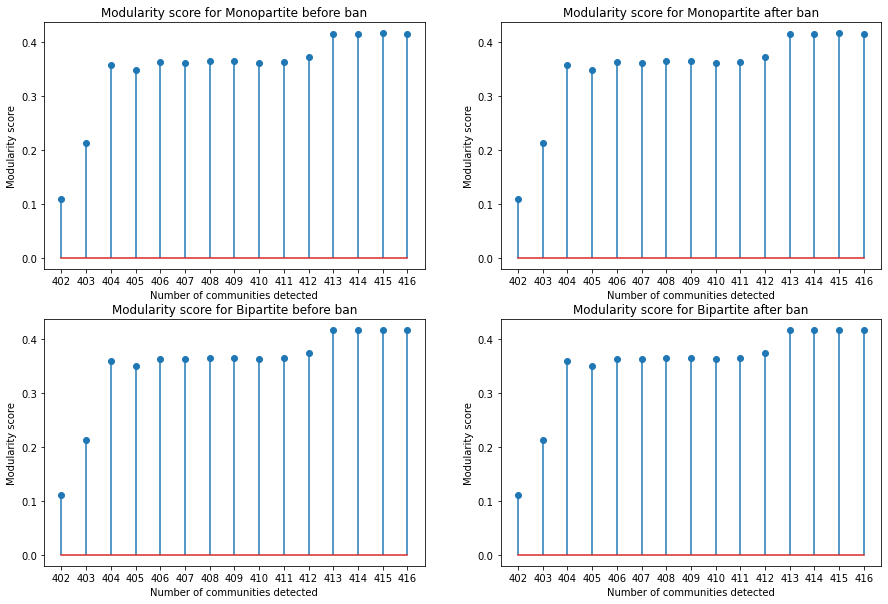

In [9]:
modularity_scores = pd.read_csv('modularity_scores.csv',index_col=0)
NetworkAnalysis.plot_modularity_scores(modularity_scores, figsize=(15,10))